In [3]:
%matplotlib inline

import matplotlib 
import numpy as np
import pandas as pd
import os, sys, time, pickle, copy
#import ipywidgets
from mpl_toolkits.mplot3d import Axes3D
import matplotlib.pyplot as plt
from matplotlib import cm
from matplotlib.ticker import LinearLocator, FormatStrFormatter
from mpl_toolkits.mplot3d.art3d import Poly3DCollection    

from scipy import optimize

import cv2 

matplotlib.rc('font', family='serif')
matplotlib.rc('font', size=12)
matplotlib.rc('legend', fontsize=16)
matplotlib.rc('legend', numpoints=1)
matplotlib.rc('legend', handlelength=1.5)
matplotlib.rc('legend', frameon=True)
matplotlib.rc('xtick.major', pad=7)
matplotlib.rc('xtick', direction="in")
matplotlib.rc('ytick', direction="in")
matplotlib.rc('xtick', top = True)
matplotlib.rc('ytick', right =True )
matplotlib.rc('xtick.minor', pad=7)
matplotlib.rc('text', usetex=True)


matplotlib.rc('figure', figsize=(12, 9))

In [68]:
def make_sp_noise_256(img, bratio, wratio):
    """
    인위적으로 S&P noise 생성
    
    parameters
    ----------
    img : 원본 이미지 행렬 (B&W 255) , uint8 type
    bratio : 전체 이미지 pixel 수에서 생성될 검은색 noise의 비율 (<1.0)
    wratio : 전체 이미지 pixel 수에서 생성될 하얀색 noise의 비율 (<1.0)
    
    
    return
    ------
    noise 가미된 이미지. uint8 type
    """
    height, width = img.shape[:2]
    Npx = img.shape[0]*img.shape[1]
    Nb = int(Npx*bratio)
    Nw = int(Npx*wratio)

    x1=np.random.randint(0, height-1, Nb)
    y1=np.random.randint(0, width-1, Nb)

    x2=np.random.randint(0, height-1, Nw)
    y2=np.random.randint(0, width-1, Nw)
    
    rimg = np.array(img, copy=True)
    rimg[x1, y1]=0
    rimg[x2, y2]=255

    return rimg

def make_gaussian_noise_256(img, std):
    """
    인위적으로 Gaussian noise 생성. Gaussian 은 평균 0, 표준편차 std 로 이미지의 픽셀 수로 생성한다.
    
    parameters
    ----------
    img : 원본 이미지 행렬 (B&W 255) , uint8 type
    std : 가우시안 분포의 표준편자. (std>0.0)
    
    
    return
    ------
    noise 가미된 이미지. uint8 type
    """
    
    noise = np.random.normal(0, std, img.shape)
    rimg = np.array(img, copy=True, dtype=np.float64)
    rimg += noise
    
    rimg[rimg<0.]=0
    rimg[rimg>255.]=255
    return rimg.astype(np.uint8)

def make_speckle_noise_256(img, std):
    """
    인위적으로 Gaussian noise 생성. Gaussian 은 평균 0, 표준편차 std 로 이미지의 픽셀 수로 생성한다.
    
    parameters
    ----------
    img : 원본 이미지 행렬 (B&W 255) , uint8 type
    std : 가우시안 분포의 표준편자. (std>0.0)
    
    
    return
    ------
    noise 가미된 이미지. uint8 type
    """
    gaus = np.random.normal(0, std, img.shape)
    rimg = np.array(img, copy=True, dtype=np.float64)
    rimg += img + img*gaus
    
    rimg[rimg<0.]=0
    rimg[rimg>255.]=255
    return rimg.astype(np.uint8)

   
        
        

def make_dstack(img, ksize):
    """
    아래의 myfilter_gray 를 위해 작성된 함수. 자세한 설명은 생략한다.
    """
    edge=(ksize-1)>>1
    pshape = (img.shape[0]+edge*2, img.shape[1]+edge*2)
    
    timglist = []
    for i in np.arange(-edge, edge+1):
        for j in np.arange(-edge, edge+1):
            
            timg = np.zeros(pshape, np.float64)
            timg[edge+i:pshape[0]-edge+i,edge+j:pshape[1]-edge+j] = (img[:,:]).astype(np.float64)
            timglist.append(timg)
    
    return np.dstack(timglist)

def myfilter_gray_256(img, kind, ksize):
    edge=(ksize-1)>>1
    kinddict = {"min":np.min, "max": np.max, "std": np.std, "median" : np.median, "mean": np.mean, "minmax": None}
    narr = make_dstack(img.astype(np.float64), ksize)[edge:-edge, edge:-edge, :]
    if kind != "minmax":
        img1 = kinddict[kind](narr, axis=2)
        
    else :
        img1 = (np.min(narr, axis=2)+np.max(narr, axis=2))/2.0
    return img1.round().astype(np.uint8)
    

Chapter 3. 공간적 이미지 필터링 (Spatial Image Filtering)
====

### 커널과 필터
- <b>커널 : </b> 이미지의 처리를 위해 특정한 기능을 수행하는 2차원 배열. 마스크 라고도 한다. 
- <b>필터 : </b> 커널+기능의 조합을 필터 (filter)라 한다.


### 공간적 필터링 (Spatial filtering)
공간적 필터링이라 함은 동일한 공 간에 어떤 필터 행렬을 생성시켜서, 그 필터 행렬과 원본 이미지 행렬 사이의 연산을 수 행하는 것

# 3.1. 선형 필터 (linear filter)

- 필터링 연산이 선형성을 갖는 경우를 이 필터에 의한 연산을 선형 필터라 한다. 

$\ast$ 이후 원본 이미지 $I$ 에 대해 필터링된 이미지를 $J$ 라 하자. $I$ 의 $(i,\,j)$ 위치의 필셀값을 $I[i,\,j]$ 라 하자. 

<br>

### 평균값 필터 (Averaging filter)
이미지의 어떤 픽셀과 그 주변의 선택된 픽셀값과의 평균으로 필셀값을 대체하는 필터. 당연히 커널은 아래와 같은 모양을 띈다.

$$
\frac{1}{9}\begin{bmatrix} 1 & 1 & 1 \\ 1 & 1 & 1 \\1 & 1 & 1 \end{bmatrix}
$$
이 때 픽셀의 값은 자신을 중심으로 한 $3\times 3$ 배열의 평균으로 대체된다. 즉

$$
J[i,\,j]=\frac{1}{9} \sum_{p=-1,\,0,\,1} \sum_{q=-1,\,0,\,1} I[i-p,\,j-q]
$$

이다. 

python에서는 cv2 라이브러리를 사용하여 다음과 같이 이용한다
~~~python
import cv2
kernel = np.ones((5,5),np.float32)/25
filtered_image = cv2.filter2D(original_image, -1, kernel)
~~~
kernel 은 $5 \times 5$ 행렬을 사용하였다. `cv2.filter2D` 함수에서의 -1 은 일단 original image 와 같은 자료형으로 filtered image 가 생성된다고 알아 두자. 

<br>

#### 가장자리 처리
이 경우 가장자리면, 즉 $i=0$ 이면 $i-1$ 픽셀이 없으므로 문제가 된다. 이렇게 필터를 쓸 경우 경계값이 문제가 되는데 이에 대한 방법은 원본 이미지를 커널을 고려하여 사이즈를 키운 다음에 새로 키워진 행렬을 특정한 값으로 채우는 것이다. $0$ 으로 채울수도 있고 가까운 경계값으로 채울 수도 있으며 다른 여려 방법이 존재한다. 각각의 경우에 맞춰 적절하게 사용할 수 밖에 없다.

<br>

### 가우시안 필터 (Gaussian filter)
$I[i,j]$ 를 필터링 할 때 주변 값과 정규분포 관계가 있다고 가정한다. 즉 멀수록 관계가 더 적다고 간주한다. 2차원 가우시안 함수는 다음과 같다.

$$
G(x,\,y | x',\,y') = \dfrac{1}{\sqrt{2 \pi \sigma^2}} \exp \left( -\dfrac{(x-x')^2+(y-y')^2}{2\sigma^2}\right)
$$

$J[i,\,j]$ 는 $I[i,\,j]$ 를 중심으로 주변값에 2차원 가우시안 함수에 비례하는 가중치를 두고 그 평균을 계산한 값이 된다. 

python의 cv2 라이브러리에서는 다음과 같이 사용한다.

~~~python
filtered_image = cv2.GaussianBlur(original_image, (3, 3), 1.5)
~~~

여기서 `(3, 3)` 은 $3 \times 3$ 크기의 커널을 사용한다는 뜻이고 1.5 는 가우시안 분포의 표준편차이다.

#### from scipy.ndimage.filters.generic_filter 와의 비교

- 아래 나오겠지만 웹상에서 python 용 non-linear filter 를 검색해보면 scipy.ndimage.filters.generic_filter를 사용하라고 나온다. 그런데 생각보다 매우 느리다. 절대로 사용하지 말고 opencv2 의 필터와 같은 다른 필터를 사용하거나, 직접 만들어 쓰는 것이 훨씬 빠르다.

In [6]:
from scipy.ndimage.filters import generic_filter
img0=cv2.cvtColor(cv2.imread("./img_filter_01.jpg"), cv2.COLOR_BGR2GRAY)

# minimum filter 동일 확인
ksize = 9
img_sci_min = generic_filter(img0, np.min, ksize, mode="constant")
img_my_min = myfilter_gray_256(img0, "min", ksize)
print("min filters are equivalent : ", ((img_sci_min.astype(np.int32)-img_my_min.astype(np.int32))==0).all())

# maximum filter 동일 확인
img_sci_max = generic_filter(img0, np.max, ksize, mode="constant")
img_my_max = myfilter_gray_256(img0, "max", ksize)
print("max filters are equivalent : ", ((img_sci_max.astype(np.int32)-img_my_max.astype(np.int32))==0).all())

# std filter 동일 확인
img_sci_std = generic_filter(img0, np.std, footprint=np.ones((ksize, ksize)), mode="constant")
img_my_std = myfilter_gray_256(img0, "std", ksize)
print("std filters are equivalent : ", ((img_sci_std.astype(np.int32)-img_my_std.astype(np.int32))==0).all())

# median filter 동일 확인
img_sci_med = generic_filter(img0, np.median, ksize, mode="constant")
img_my_med = myfilter_gray_256(img0, "median", ksize)
print("median filters are equivalent : ", ((img_sci_med.astype(np.int32)-img_my_med.astype(np.int32))==0).all())

min filters are equivalent :  True
max filters are equivalent :  True
std filters are equivalent :  False
median filters are equivalent :  True


- minimum, maximum, median filter 는 동일한 결과를 얻었으나 std filter는 차이가 있다. 얼마나 차이가 생길까? 아래 결과에서 볼 수 있듯이 그 차이는 매우 작은데 이는 내부적으로 부동소숫점을 정수로 바꾸는 과정 등에서 발행할 수 있다. 

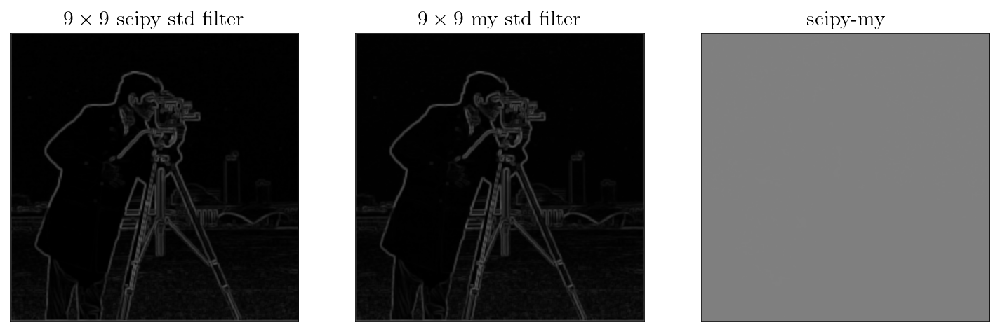

maximum difference =  1


In [34]:
fig1 = plt.figure(figsize=(12,8), dpi= 150, facecolor='w', edgecolor='k')
ax1, ax2, ax3 = fig1.add_subplot(131), fig1.add_subplot(132), fig1.add_subplot(133)
ax1.imshow(img_sci_std, cmap="gray", vmin=0, vmax=255)
ax2.imshow(img_my_std, cmap="gray", vmin=0, vmax=255)
ax3.imshow(img_sci_std.astype(np.int64)-img_my_std.astype(np.int64), cmap="gray", vmin=-255, vmax=255)
ax1.set_title("$9 \\times 9$ scipy std filter")
ax2.set_title("$9 \\times 9 $ my std filter")
ax3.set_title("scipy-my")

for ax in fig1.get_axes():
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)

plt.show()

print("maximum difference = ", np.abs(img_sci_std.astype(np.int64)-img_my_std.astype(np.int64)).max())

#### 수행 시간의 차이
 - 아래 결과에서 보듯이 그 차이가 매우 크다. 아래는 본인의 jupyter에서 수행한 결과로 거의 20배의 속도차이가 난다. scipy 의 generic filter 가 너무 느림
 
~~~
%timeit generic_filter(img0, np.std, footprint=np.ones((ksize, ksize)), mode="constant")
%timeit myfilter_gray_256(img0, "std", ksize)
11.4 s ± 34.5 ms per loop (mean ± std. dev. of 7 runs, 1 loop each)
676 ms ± 569 µs per loop (mean ± std. dev. of 7 runs, 1 loop each)
~~~



In [34]:
%timeit generic_filter(img0, np.std, footprint=np.ones((ksize, ksize)), mode="constant")
%timeit myfilter_gray_256(img0, "std", ksize)

11 s ± 68.1 ms per loop (mean ± std. dev. of 7 runs, 1 loop each)
699 ms ± 1.19 ms per loop (mean ± std. dev. of 7 runs, 1 loop each)


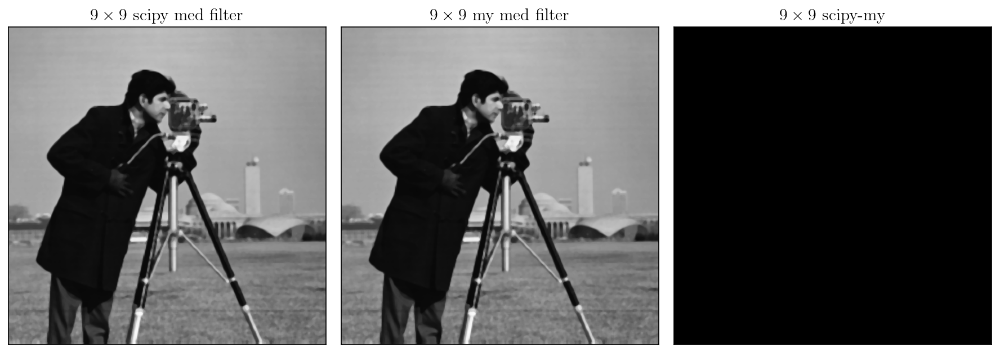

In [35]:
fig1 = plt.figure(figsize=(12,8), dpi= 150, facecolor='w', edgecolor='k')
ax1, ax2, ax3 = fig1.add_subplot(131), fig1.add_subplot(132), fig1.add_subplot(133)
ax1.imshow(img_sci_med, cmap="gray", vmin=0, vmax=255)
ax2.imshow(img_my_med, cmap="gray", vmin=0, vmax=255)
ax3.imshow(img_sci_med-img_my_med, cmap="gray", vmin=0, vmax=255)
ax1.set_title("$9 \\times 9$ scipy med filter")
ax2.set_title("$9 \\times 9$ my med filter")
ax3.set_title("$9 \\times 9 $ scipy-my ")

for ax in fig1.get_axes():
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)

fig1.tight_layout()
plt.show()


### Linear Filtering - code

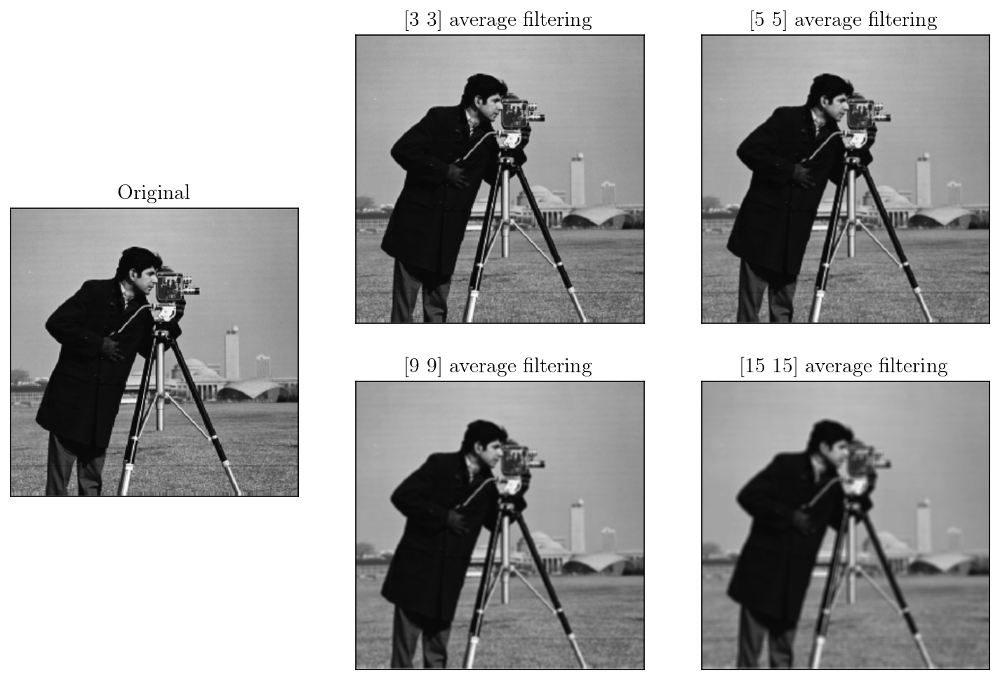

In [9]:
img1=cv2.cvtColor(cv2.imread("./img_filter_01.jpg"), cv2.COLOR_BGR2GRAY)
fig1 = plt.figure(figsize=(12,8), dpi= 150, facecolor='w', edgecolor='k')
ax1, ax2, ax3, ax4, ax5 = fig1.add_subplot(131), fig1.add_subplot(232), fig1.add_subplot(233),\
                        fig1.add_subplot(235), fig1.add_subplot(236)


ax1.imshow(img1, cmap='gray',  vmin=0, vmax=255)
ax1.set_title("Original")
ax2.imshow(cv2.filter2D(img1, -1, np.ones((3,3))/9., cv2.BORDER_CONSTANT), cmap='gray', vmin=0, vmax=255)
ax2.set_title("[3 3] average filtering")
ax3.imshow(cv2.filter2D(img1, -1, np.ones((5,5))/25., cv2.BORDER_CONSTANT), cmap='gray', vmin=0, vmax=255)
ax3.set_title("[5 5] average filtering")
ax4.imshow(cv2.filter2D(img1, -1, np.ones((9,9))/81., cv2.BORDER_CONSTANT), cmap='gray', vmin=0, vmax=255)
ax4.set_title("[9 9] average filtering")
ax5.imshow(cv2.filter2D(img1, -1, np.ones((15,15))/(15.*15.), cv2.BORDER_CONSTANT), cmap='gray', vmin=0, vmax=255)
ax5.set_title("[15 15] average filtering")

for ax in fig1.get_axes():
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)

plt.show()

### Gaussian Filtering - code

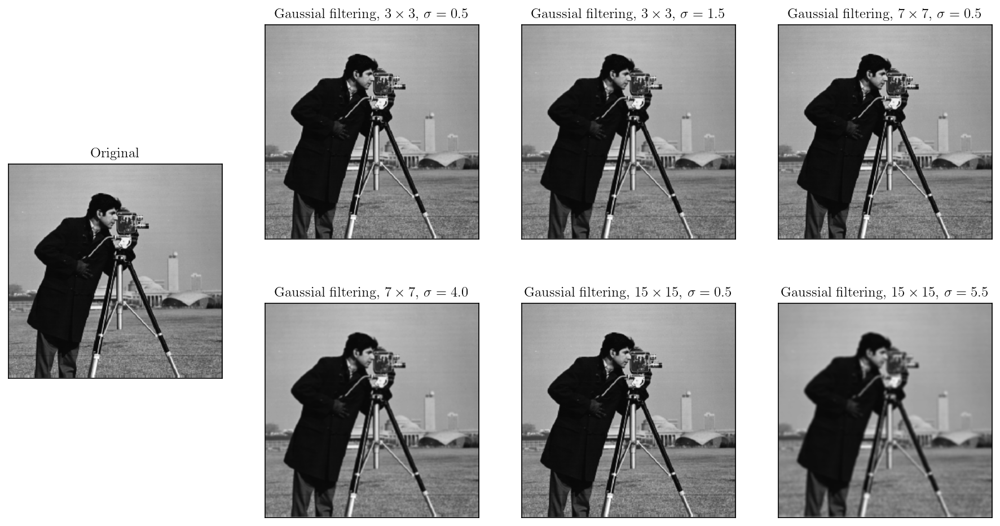

In [10]:
fig2 = plt.figure(figsize=(15,8), dpi= 150, facecolor='w', edgecolor='k')
ax1, ax2, ax3, ax4, ax5, ax6, ax7 = fig2.add_subplot(141), fig2.add_subplot(242), fig2.add_subplot(243), \
    fig2.add_subplot(244), fig2.add_subplot(246), fig2.add_subplot(247), fig2.add_subplot(248)
img2=np.array(img1, copy=True)

ax1.imshow(img2, cmap='gray',  vmin=0, vmax=255)
ax1.set_title("Original", fontdict={"fontsize":12})

ax2.imshow(cv2.GaussianBlur(img2, (3, 3), 0.5), cmap='gray', vmin=0, vmax=255)
ax2.set_title("Gaussial filtering, $3\\times 3$, $\sigma=0.5$", fontdict={"fontsize":12})

ax3.imshow(cv2.GaussianBlur(img2, (3, 3), 1.5), cmap='gray', vmin=0, vmax=255)
ax3.set_title("Gaussial filtering, $3\\times 3$, $\sigma=1.5$", fontdict={"fontsize":12})

ax4.imshow(cv2.GaussianBlur(img2, (7, 7), 0.5), cmap='gray', vmin=0, vmax=255)
ax4.set_title("Gaussial filtering, $7\\times 7$, $\sigma=0.5$", fontdict={"fontsize":12})

ax5.imshow(cv2.GaussianBlur(img2, (7, 7), 4.0), cmap='gray', vmin=0, vmax=255)
ax5.set_title("Gaussial filtering, $7\\times 7$, $\sigma=4.0$", fontdict={"fontsize":12})


ax6.imshow(cv2.GaussianBlur(img2, (15, 15), 0.5), cmap='gray', vmin=0, vmax=255)
ax6.set_title("Gaussial filtering, $15\\times 15$, $\sigma=0.5$", fontdict={"fontsize":12})

ax7.imshow(cv2.GaussianBlur(img2, (15, 15), 5.5), cmap='gray', vmin=0, vmax=255)
ax7.set_title("Gaussial filtering, $15\\times 15$, $\sigma=5.5$", fontdict={"fontsize":12})


for ax in fig2.get_axes():
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)

plt.show()

# 3.2. 비선형 필터 (nonlinear filter)

### 비선형 필터
- 중앙값 필터 (median filter) : 노이즈 처리에 좋다.

- 표준편차 필터(standard deviation filter) : 엣지 검출에 좋다.

### Median Filtering - code

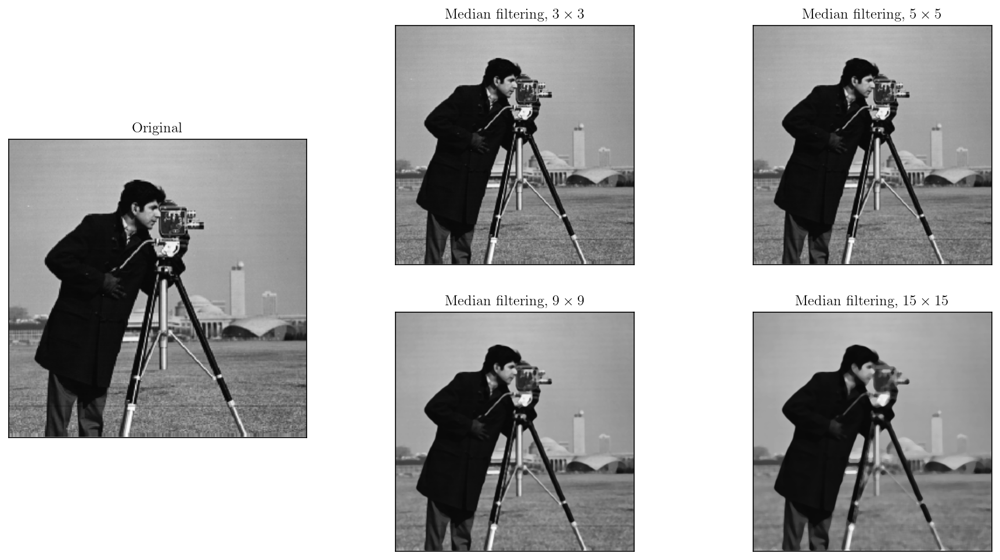

In [11]:
fig3 = plt.figure(figsize=(15,8), dpi= 150, facecolor='w', edgecolor='k')
ax1, ax2, ax3, ax4, ax5 = fig3.add_subplot(131), fig3.add_subplot(232), fig3.add_subplot(233), \
    fig3.add_subplot(235), fig3.add_subplot(236)
img3=np.array(img1, copy=True)

ax1.imshow(img3, cmap='gray',  vmin=0, vmax=255)
ax1.set_title("Original", fontdict={"fontsize":12})

ax2.imshow(cv2.medianBlur(img3, 3), cmap='gray', vmin=0, vmax=255)
ax2.set_title("Median filtering, $3\\times 3$", fontdict={"fontsize":12})

ax3.imshow(cv2.medianBlur(img3, 5), cmap='gray', vmin=0, vmax=255)
ax3.set_title("Median filtering, $5\\times 5$", fontdict={"fontsize":12})

ax4.imshow(cv2.medianBlur(img3, 9), cmap='gray', vmin=0, vmax=255)
ax4.set_title("Median filtering, $9\\times 9$", fontdict={"fontsize":12})

ax5.imshow(cv2.medianBlur(img3, 15), cmap='gray', vmin=0, vmax=255)
ax5.set_title("Median filtering, $15\\times 15$", fontdict={"fontsize":12})




for ax in fig3.get_axes():
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)

plt.show()

### Median Filtering and Noise - code

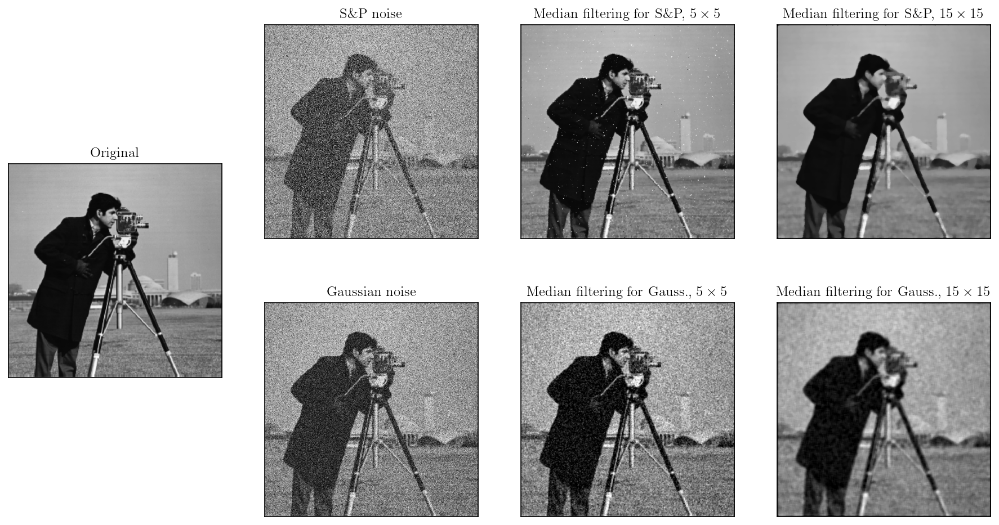

In [12]:
fig4 = plt.figure(figsize=(15,8), dpi= 150, facecolor='w', edgecolor='k')
ax1, ax2, ax3, ax4, ax5, ax6, ax7 = fig4.add_subplot(141), fig4.add_subplot(242), fig4.add_subplot(243), \
    fig4.add_subplot(244), fig4.add_subplot(246), fig4.add_subplot(247), fig4.add_subplot(248)

# 원본에 S&P noise 가미.
img4_1 = make_sp_noise_256(img1, 0.3, 0.3)

# 원본에 Gaussian noise 가미
img5_1 = make_gaussian_noise_256(img1, 100.)

ax1.imshow(img1, cmap='gray',  vmin=0, vmax=255)
ax1.set_title("Original", fontdict={"fontsize":12})

ax2.imshow(img4_1, cmap='gray',  vmin=0, vmax=255)
ax2.set_title("S\&P noise", fontdict={"fontsize":12})

ax3.imshow(myfilter_gray_256(img4_1, "median", 5), cmap='gray', vmin=0, vmax=255)
ax3.set_title("Median filtering for S\&P, $5\\times 5$", fontdict={"fontsize":12})

ax4.imshow(myfilter_gray_256(img4_1, "median", 15), cmap='gray', vmin=0, vmax=255)
ax4.set_title("Median filtering for S\&P, $15\\times 15$", fontdict={"fontsize":12})


ax5.imshow(img5_1, cmap='gray',  vmin=0, vmax=255)
ax5.set_title("Gaussian noise", fontdict={"fontsize":12})


ax6.imshow(myfilter_gray_256(img5_1, "median", 5), cmap='gray', vmin=0, vmax=255)
ax6.set_title("Median filtering for Gauss., $5\\times 5$", fontdict={"fontsize":12})

ax7.imshow(myfilter_gray_256(img5_1, "median", 15), cmap='gray', vmin=0, vmax=255)
ax7.set_title("Median filtering for Gauss., $15\\times 15$", fontdict={"fontsize":12})



for ax in fig4.get_axes():
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)

plt.show()

### Nonliear filters - code

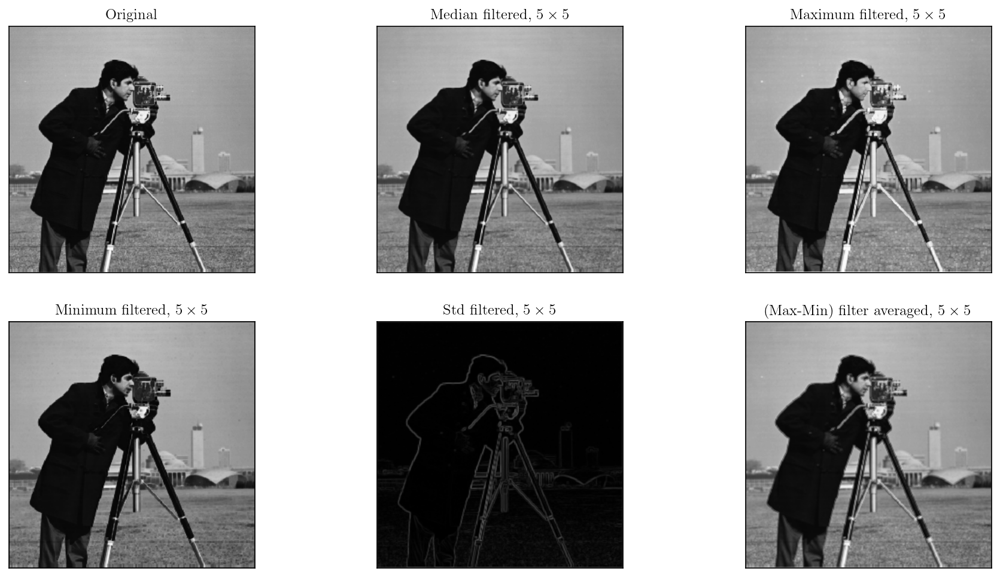

In [13]:


fig6 = plt.figure(figsize=(15,8), dpi= 150, facecolor='w', edgecolor='w')
ax1, ax2, ax3, ax4, ax5, ax6 = fig6.add_subplot(231), fig6.add_subplot(232), fig6.add_subplot(233), \
    fig6.add_subplot(234), fig6.add_subplot(235), fig6.add_subplot(236)
img6=np.array(img1, copy=True)

# original image
ax1.imshow(img6, cmap='gray',  vmin=0, vmax=255)
ax1.set_title("Original", fontdict={"fontsize":12})

# median filter
ax2.imshow(myfilter_gray_256(img6, "median", 5), cmap='gray', vmin=0, vmax=255)
ax2.set_title("Median filtered, $5\\times 5$", fontdict={"fontsize":12})

# Maximum filter
ax3.imshow(myfilter_gray_256(img6, "max", 5), cmap='gray', vmin=0, vmax=255)
ax3.set_title("Maximum filtered, $5\\times 5$", fontdict={"fontsize":12})

# Minimum filter
ax4.imshow(myfilter_gray_256(img6, "min", 5), cmap='gray', vmin=0, vmax=255)
ax4.set_title("Minimum filtered, $5\\times 5$", fontdict={"fontsize":12})

# Std filter
ax5.imshow(myfilter_gray_256(img6, "std", 7), cmap='gray', vmin=0, vmax=255)
ax5.set_title("Std filtered, $5\\times 5$", fontdict={"fontsize":12})

#(Max-Min) average filter
Mna=(myfilter_gray_256(img6, "max", 5).astype(np.uint32)+myfilter_gray_256(img6, "min", 5).astype(np.uint32))/2.
ax6.imshow(Mna, cmap='gray', vmin=0, vmax=255)
ax6.set_title("(Max-Min) filter averaged, $5\\times 5$", fontdict={"fontsize":12})

for ax in fig6.get_axes():
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)

    
    
    
plt.show()

### Nonlinear filter for S&P noise - code

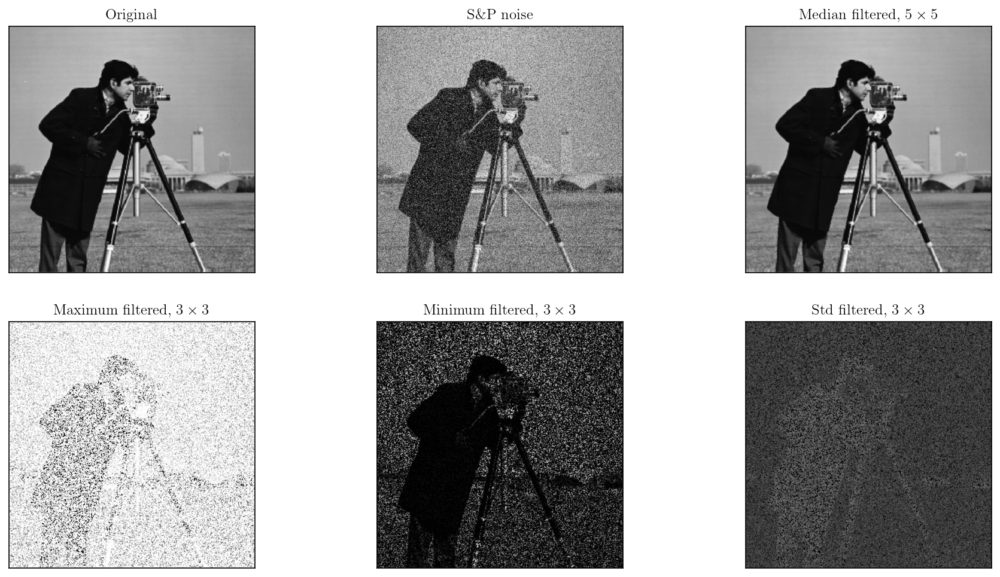

In [15]:

fig7 = plt.figure(figsize=(15,8), dpi= 150, facecolor='w', edgecolor='w')
ax1, ax2, ax3, ax4, ax5, ax6 = fig7.add_subplot(231), fig7.add_subplot(232), fig7.add_subplot(233), \
    fig7.add_subplot(234), fig7.add_subplot(235), fig7.add_subplot(236)
img7 = np.array(img1, copy=True)


# 인위적으로 S&P noise 생성
img7_1 = make_sp_noise_256(img7, 0.15, 0.15)

# original image
ax1.imshow(img7, cmap='gray',  vmin=0, vmax=255)
ax1.set_title("Original", fontdict={"fontsize":12})

# S&P noise 
ax2.imshow(img7_1, cmap='gray', vmin=0, vmax=255)
ax2.set_title("S\&P noise", fontdict={"fontsize":12})



# medial filter
ax3.imshow(myfilter_gray_256(img7_1, "median", 5), cmap='gray', vmin=0, vmax=255)
ax3.set_title("Median filtered, $5\\times 5$", fontdict={"fontsize":12})

# Maximum filter
ax4.imshow(myfilter_gray_256(img7_1, "max", 3), cmap='gray', vmin=0, vmax=255)
ax4.set_title("Maximum filtered, $3\\times 3$", fontdict={"fontsize":12})

# Minimum filter
ax5.imshow(myfilter_gray_256(img7_1, "min", 3), cmap='gray', vmin=0, vmax=255)
ax5.set_title("Minimum filtered, $3\\times 3$", fontdict={"fontsize":12})

#Std filter
ax6.imshow(myfilter_gray_256(img7_1, "std" , 3), cmap='gray', vmin=0, vmax=255)
ax6.set_title("Std filtered, $3\\times 3$", fontdict={"fontsize":12})


for ax in fig7.get_axes():
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)
    
plt.show()

### Non linear filter for Gaussian noise - code


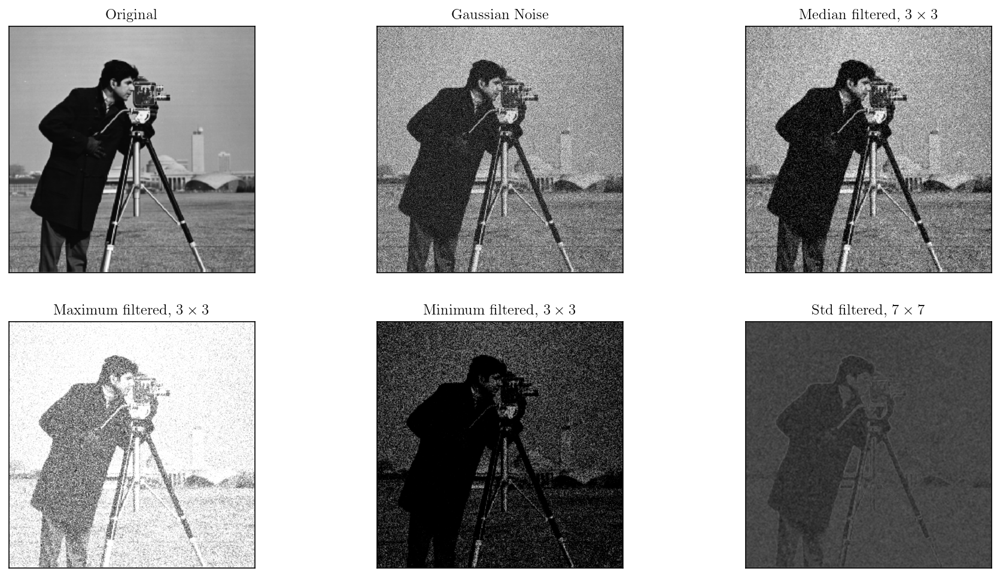

In [16]:
fig8 = plt.figure(figsize=(15,8), dpi= 150, facecolor='w', edgecolor='w')
ax1, ax2, ax3, ax4, ax5, ax6 = fig8.add_subplot(231), fig8.add_subplot(232), fig8.add_subplot(233), \
    fig8.add_subplot(234), fig8.add_subplot(235), fig8.add_subplot(236)
img8 = np.array(img1, copy=True)


# 인위적으로 Gaussian noise 생성
img8_1 = make_gaussian_noise_256(img8, 80)


# original image
ax1.imshow(img8, cmap='gray',  vmin=0, vmax=255)
ax1.set_title("Original", fontdict={"fontsize":12})

# Gaussian noise 
ax2.imshow(img8_1, cmap='gray', vmin=0, vmax=255)
ax2.set_title("Gaussian Noise", fontdict={"fontsize":12})


# medial filter
ax3.imshow(myfilter_gray_256(img8_1, "median", 3), cmap='gray', vmin=0, vmax=255)
ax3.set_title("Median filtered, $3\\times 3$", fontdict={"fontsize":12})

# Maximum filter
ax4.imshow(myfilter_gray_256(img8_1, "max", 3), cmap='gray', vmin=0, vmax=255)
ax4.set_title("Maximum filtered, $3\\times 3$", fontdict={"fontsize":12})

# Minimum filter
ax5.imshow(myfilter_gray_256(img8_1, "min", 3), cmap='gray', vmin=0, vmax=255)
ax5.set_title("Minimum filtered, $3\\times 3$", fontdict={"fontsize":12})

# Std filter
ax6.imshow(myfilter_gray_256(img8_1, "std", 7), cmap='gray', vmin=0, vmax=255)
ax6.set_title("Std filtered, $7\\times 7$", fontdict={"fontsize":12})



for ax in fig8.get_axes():
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)

plt.show()

### Python function for Order Static Nonlinear Filter

- 권석준 교수님의 강의록에는 matlab의 ordfilt2 를 사용했는데 python의 opencv2 나 scipy 에서 유사한 것을 찾을 수 없어서 ordfilt2와 동일한 것을 만들어 봤다.

In [17]:
def make_dstack_ord(img, kernel):
    
    edim = ((kernel.shape[0]-1)>>1, (kernel.shape[1]-1)>>1)
    pshape = (img.shape[0]+edim[0]*2, img.shape[1]+edim[1]*2)
    
    
    timglist = []
    nonzero_index = []
    for i in np.arange(-edim[0], edim[0]+1):
        for j in np.arange(-edim[1], edim[1]+1):
            kval = kernel[edim[0]-i, edim[1]-j]
            if kval != 0 :
                timg = np.zeros(pshape, np.float64)
                timg[edim[0]+i:pshape[0]-edim[0]+i,edim[1]+j:pshape[1]-edim[1]+j] = kval*(img[:,:]).astype(np.float64)
                timglist.append(timg)
                nonzero_index.append([edim[0]-i, edim[1]-j])
    return np.dstack(timglist)

def pyordfilt2(img, kind, kernel):
    edim = ((kernel.shape[0]-1)>>1, (kernel.shape[1]-1)>>1)
    kinddict = {"min":np.min, "max": np.max, "std": np.std, "median" : np.median, "mean": np.mean, "minmax": None, "sum": np.sum}
    narr = make_dstack_ord(img.astype(np.float64), kernel)[edim[0]:-edim[0], edim[1]:-edim[1], :]
    if kind != "minmax":
        img1 = kinddict[kind](narr, axis=2)
        
    else :
        img1 = (np.min(narr, axis=2)+np.max(narr, axis=2))/2.0
    return img1.round().astype(np.uint8)


def pyordfilt2r(img, kind, kernel):
    edim = ((kernel.shape[0]-1)>>1, (kernel.shape[1]-1)>>1)
    kinddict = {"min":np.min, "max": np.max, "std": np.std, "median" : np.median, "mean": np.mean, "minmax": None, "sum": np.sum}
    narr = make_dstack_ord(img.astype(np.float64), kernel)[edim[0]:-edim[0], edim[1]:-edim[1], :]
    if kind != "minmax":
        img1 = kinddict[kind](narr, axis=2)
        
    else :
        img1 = (np.min(narr, axis=2)+np.max(narr, axis=2))/2.0
    return img1.round().astype(np.int64)

### Order Static Non-Linear Filter - code

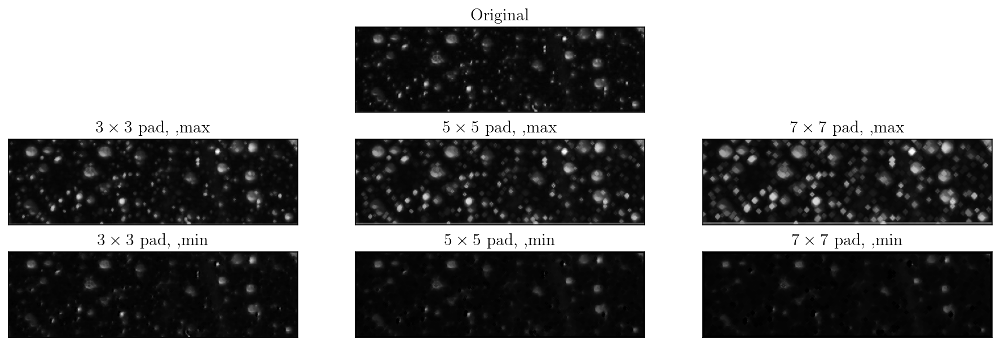

In [36]:
fig = plt.figure(figsize=(15,5), dpi= 150, facecolor='w', edgecolor='w')
ax1, ax2, ax3, ax4, ax5, ax6, ax7= fig.add_subplot(332), fig.add_subplot(334), fig.add_subplot(335), \
    fig.add_subplot(336), fig.add_subplot(337), fig.add_subplot(338), fig.add_subplot(339)
img_o =cv2.cvtColor(cv2.imread("./img_ordfilt_01.jpg"), cv2.COLOR_BGR2GRAY)[::4, ::4]

ax1.imshow(img_o, cmap="gray", vmin=0, vmax=255)
ax1.set_title("Original")
ker3 = np.array([[0, 1, 0], [1, 0, 1], [0, 1, 0]])
ker5 = np.array([[0,0,1,0,0], [0,1,0,1,0], [1,1,0,1,1],[0,1,0,1,0], [0,0,1,0,0]])
ker7 = np.array([[0,0,0,1,0,0,0], [0,0,1,1,1,0,0], [0,1,1,1,1,1,0], [1,1,1,0,1,1,1],
                 [0,1,1,1,1,1,0], [0,0,1,1,1,0,0], [0,0,0,1,0,0,0]])

ax2.imshow(pyordfilt2(img_o, "max", ker3),  cmap='gray', vmin=0, vmax=255)
ax2.set_title("$3\\times 3$ pad, ,max")
ax3.imshow(pyordfilt2(img_o, "max", ker5),  cmap='gray', vmin=0, vmax=255)
ax3.set_title("$5\\times 5$ pad, ,max")
ax4.imshow(pyordfilt2(img_o, "max", ker7),  cmap='gray', vmin=0, vmax=255)
ax4.set_title("$7\\times 7$ pad, ,max")
ax5.imshow(pyordfilt2(img_o, "min", ker3),  cmap='gray', vmin=0, vmax=255)
ax5.set_title("$3\\times 3$ pad, ,min")
ax6.imshow(pyordfilt2(img_o, "min", ker5),  cmap='gray', vmin=0, vmax=255)
ax6.set_title("$5\\times 5$ pad, ,min")
ax7.imshow(pyordfilt2(img_o, "min", ker7),  cmap='gray', vmin=0, vmax=255)
ax7.set_title("$7\\times 7$ pad, ,min")


for ax in fig.get_axes():
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)

plt.show()

### Order Static Filter for S&P Noise - code

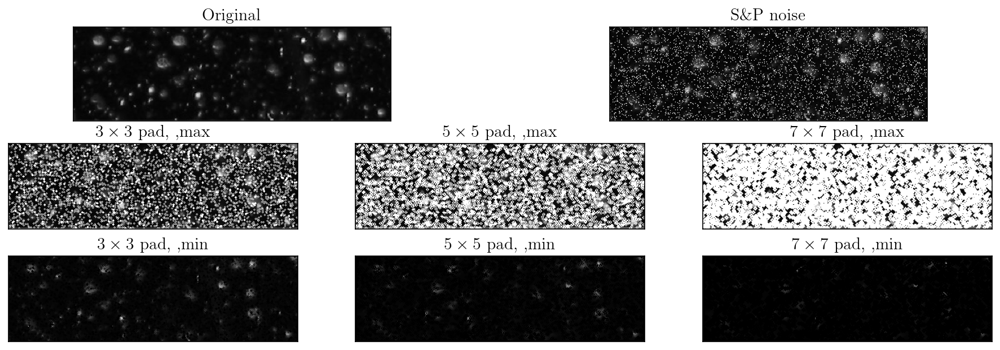

In [37]:
fig = plt.figure(figsize=(15,5), dpi= 150, facecolor='w', edgecolor='w')
ax1, ax1_1, ax2, ax3, ax4, ax5, ax6, ax7= fig.add_subplot(321), fig.add_subplot(322), fig.add_subplot(334), fig.add_subplot(335), \
    fig.add_subplot(336), fig.add_subplot(337), fig.add_subplot(338), fig.add_subplot(339)
img_os = make_sp_noise_256(img_o, 0.07, 0.07)


ax1.imshow(img_o, cmap="gray", vmin=0, vmax=255)
ax1.set_title("Original")
ax1_1.imshow(img_os, cmap="gray", vmin=0, vmax=255)
ax1_1.set_title("S\&P noise")
ker3 = np.array([[0, 1, 0], [1, 0, 1], [0, 1, 0]])
ker5 = np.array([[0,0,1,0,0], [0,1,0,1,0], [1,1,0,1,1],[0,1,0,1,0], [0,0,1,0,0]])
ker7 = np.array([[0,0,0,1,0,0,0], [0,0,1,1,1,0,0], [0,1,1,1,1,1,0], [1,1,1,0,1,1,1],
                 [0,1,1,1,1,1,0], [0,0,1,1,1,0,0], [0,0,0,1,0,0,0]])

ax2.imshow(pyordfilt2(img_os, "max", ker3),  cmap='gray', vmin=0, vmax=255)
ax2.set_title("$3\\times 3$ pad, ,max")
ax3.imshow(pyordfilt2(img_os, "max", ker5),  cmap='gray', vmin=0, vmax=255)
ax3.set_title("$5\\times 5$ pad, ,max")
ax4.imshow(pyordfilt2(img_os, "max", ker7),  cmap='gray', vmin=0, vmax=255)
ax4.set_title("$7\\times 7$ pad, ,max")
ax5.imshow(pyordfilt2(img_os, "min", ker3),  cmap='gray', vmin=0, vmax=255)
ax5.set_title("$3\\times 3$ pad, ,min")
ax6.imshow(pyordfilt2(img_os, "min", ker5),  cmap='gray', vmin=0, vmax=255)
ax6.set_title("$5\\times 5$ pad, ,min")
ax7.imshow(pyordfilt2(img_os, "min", ker7),  cmap='gray', vmin=0, vmax=255)
ax7.set_title("$7\\times 7$ pad, ,min")

for ax in fig.get_axes():
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False) 
plt.show()

### Order Static Filter for S&P Noise - code 

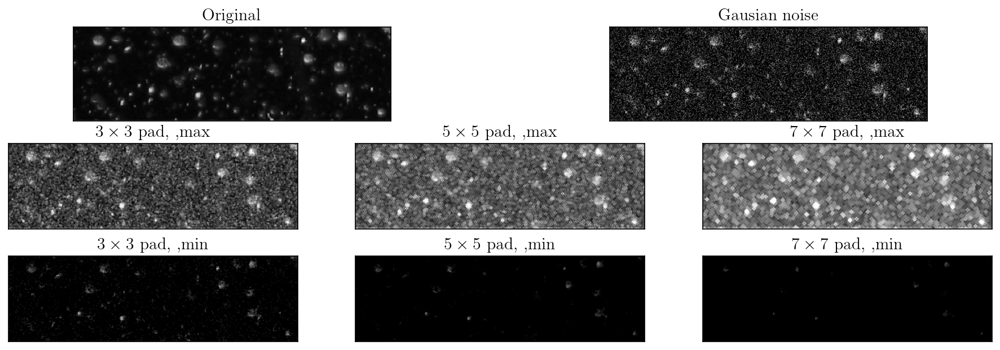

In [20]:
fig = plt.figure(figsize=(15,5), dpi= 150, facecolor='w', edgecolor='w')
ax1, ax1_1, ax2, ax3, ax4, ax5, ax6, ax7= fig.add_subplot(321), fig.add_subplot(322), fig.add_subplot(334), fig.add_subplot(335), \
    fig.add_subplot(336), fig.add_subplot(337), fig.add_subplot(338), fig.add_subplot(339)

img_og =make_gaussian_noise_256(img_o, 50)


ax1.imshow(img_o, cmap="gray", vmin=0, vmax=255)
ax1.set_title("Original")
ax1_1.imshow(img_og, cmap="gray", vmin=0, vmax=255)
ax1_1.set_title("Gausian noise")
ker3 = np.array([[0, 1, 0], [1, 0, 1], [0, 1, 0]])
ker5 = np.array([[0,0,1,0,0], [0,1,0,1,0], [1,1,0,1,1],[0,1,0,1,0], [0,0,1,0,0]])
ker7 = np.array([[0,0,0,1,0,0,0], [0,0,1,1,1,0,0], [0,1,1,1,1,1,0], [1,1,1,0,1,1,1],
                 [0,1,1,1,1,1,0], [0,0,1,1,1,0,0], [0,0,0,1,0,0,0]])

ax2.imshow(pyordfilt2(img_og, "max", ker3),  cmap='gray', vmin=0, vmax=255)
ax2.set_title("$3\\times 3$ pad, ,max")
ax3.imshow(pyordfilt2(img_og, "max", ker5),  cmap='gray', vmin=0, vmax=255)
ax3.set_title("$5\\times 5$ pad, ,max")
ax4.imshow(pyordfilt2(img_og, "max", ker7),  cmap='gray', vmin=0, vmax=255)
ax4.set_title("$7\\times 7$ pad, ,max")
ax5.imshow(pyordfilt2(img_og, "min", ker3),  cmap='gray', vmin=0, vmax=255)
ax5.set_title("$3\\times 3$ pad, ,min")
ax6.imshow(pyordfilt2(img_og, "min", ker5),  cmap='gray', vmin=0, vmax=255)
ax6.set_title("$5\\times 5$ pad, ,min")
ax7.imshow(pyordfilt2(img_og, "min", ker7),  cmap='gray', vmin=0, vmax=255)
ax7.set_title("$7\\times 7$ pad, ,min")


for ax in fig.get_axes():
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)
    
plt.show()

# 3.3. 합성곱 개념으로서의 이미지 필터링

### 합성곱과 상관값
원본 이미지 $I[i,\,j]$ 와 kernel $k[i,\,j]$ 사이의 합성곱 $g=k \ast I$ 와 상관값 $c=k \otimes I$ 는 각각 다음과 같이 정의된다.

$$
\begin{aligned}
g[i,\,j] &= k \ast I = \sum_{s=-a}^{a} \sum_{t=-b}^b k[s,\,t] \,I[i-s,\, j-t]\\
c[i,\,j] &= k \otimes I = \sum_{s=-a}^{a} \sum_{t=-b}^b k[s,\,t]\, I[i+s,\, j+t]
\end{aligned}
$$


# 3.4. 빈도 필터 (Frequency filter)

### 이미지에 있어 ‘빈도 (frequency)’
- 이미지에서 어떤 픽셀과 바로 이웃한 픽셀의 값이 매우 큰 차이를 보일 때 그 픽셀을 중심으로 픽셀 값의 ‘변화’는 매우 크다고 할 수 있다. 이렇게 픽셀 값의 변화가 매우 짧은 픽셀 간격에서 나타날 때, 그 픽셀은 <b>높은 주파수 성분</b>, 반대의 경우를 <b>낮은 주파수 성분</b>이라고 부른다.

<br>

#### 하이패스 필터 (high-pass filter), 로우패스 필터 (low-pass filter)
- 필터가 낮은 빈도를 나타내는 성분만 제거하거나 픽셀 값을 줄이는 기능을 갖는다면 하이패스 필터라 하고, 그 반대의 경우를 로우패스 필터라 한다.
- 사실 하이패스 필터는 이미지에서 가장자리 (엣지, edge)를 찾아 내거나 가장자리 신호를 선택적으로 강화하는 기능으로 자주 사용된다. 
- 앞서 살펴 본 평균값, 중간값, 가우시안 필터 등이 로우패스 필터이다. 

### Unsharp masking & highboost filtering

<br>

#### Unsharp mask
- 원본 이미지를 일단 평균값 필터링 같은 로우패스 필터로 블러링 (blurring) 처리한 후, 원본 이미지에서 처리된 이미지를 빼서 차이 값으로 이루어진 행렬을 ‘Unsharp mask’ 라 한다. 원본이미지를 $I[i,j]$, 블러링 된 이미지를 $\overline{I}[i,j]$ 라 하면 unsharp mask $M[i,j]$ 는 다음과 같다.

$$
M[i,j]=I[i,j]-\overline{I}[i,j]
$$

<br>

#### Highboost filtering
- 이 때 어떤 1보다 큰 양의 실수 $k$ 를 $M[i,j]$ 에 곱해서 원본에 더해준다면 가장자리신호가 더 현저해지며 이것을 highboost filtering 이라 한다. 즉

$$
J[i,j]=I[i,j]+k\,M[i,j] = I[i,j]+k(I[i,j]-\overline{I}[i,j])
$$

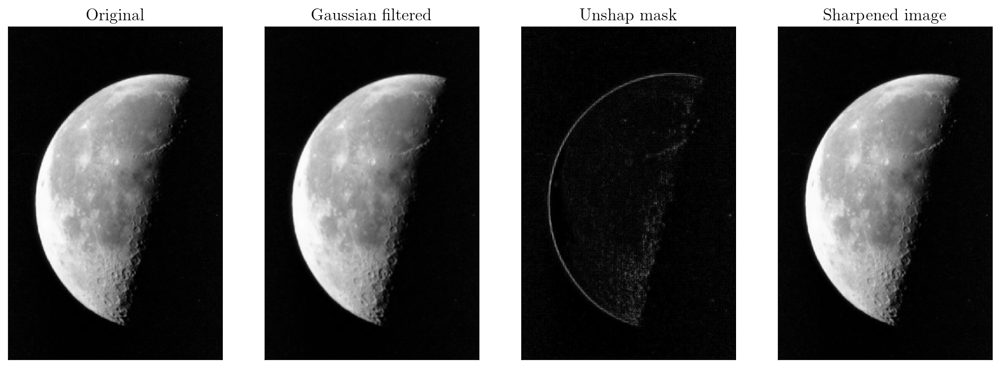

In [21]:
fig = plt.figure(figsize=(15,8), dpi= 150, facecolor='w', edgecolor='w')
ax1, ax2, ax3, ax4 = fig.add_subplot(141), fig.add_subplot(142), fig.add_subplot(143), \
    fig.add_subplot(144)
imgu =cv2.cvtColor(cv2.imread("./img_sharp_01.jpg"), cv2.COLOR_BGR2GRAY)
ax1.imshow(imgu, cmap='gray', vmin=0, vmax=255)
ax1.set_title("Original")

imgug = cv2.GaussianBlur(imgu, (3, 3), 2.)
ax2.imshow(imgug, cmap="gray", vmin=0, vmax=255)
ax2.set_title("Gaussian filtered")

imgm = np.abs(imgu.astype(np.int32)-imgug.astype(np.int32))
ax3.imshow(imgm, cmap="gray")#, vmin=-255, vmax=255)
ax3.set_title("Unshap mask")

imgg = imgu+1*imgm
ax4.imshow(imgg, cmap="gray", vmin=0, vmax=255)
ax4.set_title("Sharpened image")

for ax in fig.get_axes():
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)
    
plt.show()

### Differential High-pass Filter

픽셀에 미분을 적용한다면 일단 간단하게 생각하면, $x$ 방향 편미분은 $\partial_x I [i,j]=I[i,j]-I[i-1,j]$ or $\partial_x I[i,j]=I[i+1,j]-I[i,j]$ 이며 $y$ 방향 편미분은 $\partial_y I[i,j]=I[i,j]-I[i,j-1]$ 혹은 $\partial_y I[i,j]=I[i,j+1]-I[i,j]$ 가 될 것이다. 

<br>

#### 로버츠 커널 (Roberts kernel)

대각선 방향의 편미분에 해당하는 2차원 배열을 로버츠 마스크라 하며 아래와 같다.

$$
G_x = \begin{bmatrix} +1&0&0 \\ 0&-1&0 \\ 0&0&0 \end{bmatrix}, \quad G_y=\begin{bmatrix}0&+1&0\\-1&0&0\\0&0&0 \end{bmatrix}
$$

<br>

#### Prewitt kernel

$$
G_x = \begin{bmatrix}+1&0&-1\\+1&0&-1\\+1&0&-1\end{bmatrix}, \qquad 
G_y = \begin{bmatrix}+1&+1&+1\\0&0&0\\-1&-1&-1\end{bmatrix}
$$

<br>

#### Sobel kernel

$$
G_x = \begin{bmatrix}+1&0&-1\\+2&0&-2\\+1&0&-1\end{bmatrix},\qquad
G_y = \begin{bmatrix}+1&+2&+1\\0&0&0\\-1&-2&-1\end{bmatrix}
$$



In [22]:
mask_simple_y = np.array([[0,0,0],[0,-1,0], [0,1,0]])
mask_simple_x = np.array([[0,0,0], [0, -1, 1], [0,0,0]])
mask_roberts_x = np.array([[-1,0,0], [0,1,0], [0,0,0]])
mask_roberts_y = np.array([[0,0,-1], [0,1,0], [0,0,0]])
mask_prewitt_x = np.array([[-1,0,1],[-1,0,1],[-1,0,1]])
mask_prewitt_y = np.array([[1,1,1],[0,0,0],[-1,-1,-1]])
mask_sobel_x = np.array([[-1,0,1],[-2,0,2],[-1,0,1]])
mask_sobel_y = np.array([[1,2,1], [0,0,0],[-1,-2,-1]])

def laplacianfilter(alpha=0.2):
    a=alpha
    return 1.0/(a+1) *np.array([[a, 1-a, a], [1-a, -4 , 1-a],[a, 1-a, a]])

mask_laplacial_0p2 = laplacianfilter(0.2)

def LoGfilter(ksize, sigma):
    fa = np.zeros((ksize, ksize), np.float64)
    edge = ((ksize-1)>>1)
    for i in range(ksize):
        for j in range(ksize):
            x, y =i-edge, j-edge
            fa[i,j]=(x**2+y**2-2*sigma**2)/(sigma**4)*np.exp(-(x**2+y**2)/(2*sigma**2))
    return fa
mask_log1=LoGfilter(5, 0.5)
mask_log2=LoGfilter(5, 1.)
mask_log3 = LoGfilter(5, 1.5)


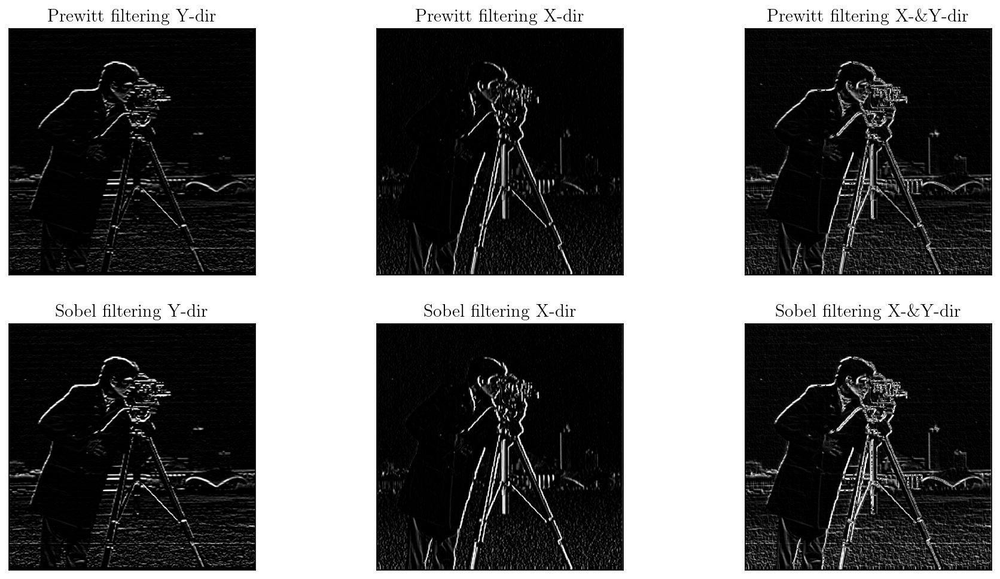

In [47]:
img00=cv2.cvtColor(cv2.imread("./img_filter_01.jpg"), cv2.COLOR_BGR2GRAY)
img0 = cv2.resize(img00, dsize=(512, 512), interpolation=cv2.INTER_AREA)

fig = plt.figure(figsize=(15,8), dpi= 150, facecolor='w', edgecolor='w')
ax1, ax2, ax3, ax4, ax5, ax6 = fig.add_subplot(231), fig.add_subplot(232), fig.add_subplot(233), \
    fig.add_subplot(234), fig.add_subplot(235), fig.add_subplot(236)

img_prewitt_y = cv2.filter2D(img0, -1, mask_prewitt_y)
ax1.imshow(img_prewitt_y, cmap="gray", vmin=0, vmax=255)
ax1.set_title("Prewitt filtering Y-dir")
img_prewitt_x = cv2.filter2D(img0, -1, mask_prewitt_x)
ax2.imshow(img_prewitt_x, cmap="gray", vmin=0, vmax=255)
ax2.set_title("Prewitt filtering X-dir")

ax3.imshow((img_prewitt_x+img_prewitt_y)/2., cmap='gray')#, vmin=0, vmax=255)
ax3.set_title("Prewitt filtering X-\&Y-dir")


img_sobel_y = cv2.filter2D(img0, -1, mask_sobel_y)
ax4.imshow(img_sobel_y, cmap="gray", vmin=0, vmax=255)
ax4.set_title("Sobel filtering Y-dir")
img_sobel_x = cv2.filter2D(img0, -1, mask_sobel_x)
ax5.imshow(img_sobel_x, cmap="gray", vmin=0, vmax=255)
ax5.set_title("Sobel filtering X-dir")

ax6.imshow((img_sobel_x+img_sobel_y)/2., cmap='gray')#, vmin=0, vmax=255)
ax6.set_title("Sobel filtering X-\&Y-dir")
for ax in fig.get_axes():
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)
    
plt.show()

### Laplaician filter
- 1차 미분 필터들은 한 번만 차분 값을 계산하기 때문에, 차 분의 크기도 작고, 이로 인해서 경계가 확실한 부분만 추출할 수 있는 반면, 노이즈가 있거나 엣지 (edge)의 강도가 약한 부분에는 불완전한 추출을 보이는 한계가 있다. 
- 이를 극복하기 위해 개발된 필터가 2차 미분형, 즉, 라플라시안 필터 (Laplacian filter) 이다. 라플라시안 필터는 말 그대로, 연속 함수 f(x,y)의 이계 도함수를 의미하는 라플라시안으로부터 유래한 것으로, 디지털 이미지에 대해, 아래와 같은 근사 공식을 활용하여 만들 수 있다.

$$
\begin{aligned}
\nabla^2 f &= \partial_x^2 f + \partial_y^2 f \\ 
\partial_x^2 I[i,j] & = I[i-1,j]+I[i+1,j]-2I[i,j] \\
\partial_y^2 I[i,j] & = I[i,j-1]+I[i,k+1]-2I[i,j] \\
\nabla^2 I[i,j] &= \partial_x^2 I[i,j]+ \partial_y^2 I[i,j] =I[i-1,j]+I[i+1,j]+I[i,j-1]+I[i,k+1]-4I[i,j]
\end{aligned}
$$


- 라플라시안 필터는, 앞서 살펴 본 1차 미분형 필터보다, 더 넓은 범위에서 그리고 모든 방향을 고려하여 차분 값을 계산할 수 있기 때문에, 경계선에서 픽셀 값이 변화하는 것 을 훨씬 강한 강도로 잡아낼 수 있으며, 이로 인해, 잡음에도 강하고, 엣지 정보를 더 잘 추출할 수 있다는 장점이 있다. 다만, 계산 시간은 1차 미분형 필터보다는 늘어나게 된다.


- Matlab 에서는 `fspecial(‘laplacian’,alpha)` 의 명령어로 laplacian kernel 을 만드는데 이는 보통의 laplacian kernel을 약간 수정한 것으로 다음과 같이 정의된다.
$$
\dfrac{1}{1+\alpha} \begin{bmatrix} \alpha & 1-\alpha & \alpha  \\ - \alpha & 4 & - \alpha \\ \alpha & 1-\alpha & \alpha\end{bmatrix}
$$

Matlab 에서는 $\alpha$ 값을 $[0,\,1)$ 에서 조정한다고 하는데, cv2 에서는 이러한 함수를 찾을 수 없어서 직접 만들어 사용하였다. 

### Laplacian of Gaussian Filter (LoG filter)

- 원본 이미지에 가우시안 블러링을 한 후 라플라시안 필터를 적용한다.

- 이 때 LoG filter 는 다음과 같은 꼴을 띈다.

$$
\nabla^2 \left( G_{\sigma} (x,\,y) \right) = \dfrac{x^2+y^2-2\sigma^2}{\sigma^4} \exp \left(- \dfrac{x^2+y^2}{2\sigma^2}\right)
$$

- 라플라시안 필터와 유사하게, LoG 필터도 이미지에서 엣지 부분의 정보를 효과적으로 추출할 수 있다. 특히, 라플라시안 필터보다 더 넓은 범위에서 이미지 합성 곱을 하기 때문에, 이미지 추출 과정에서 왜곡 가능성을 줄일 수 있다는 장점이 있다.

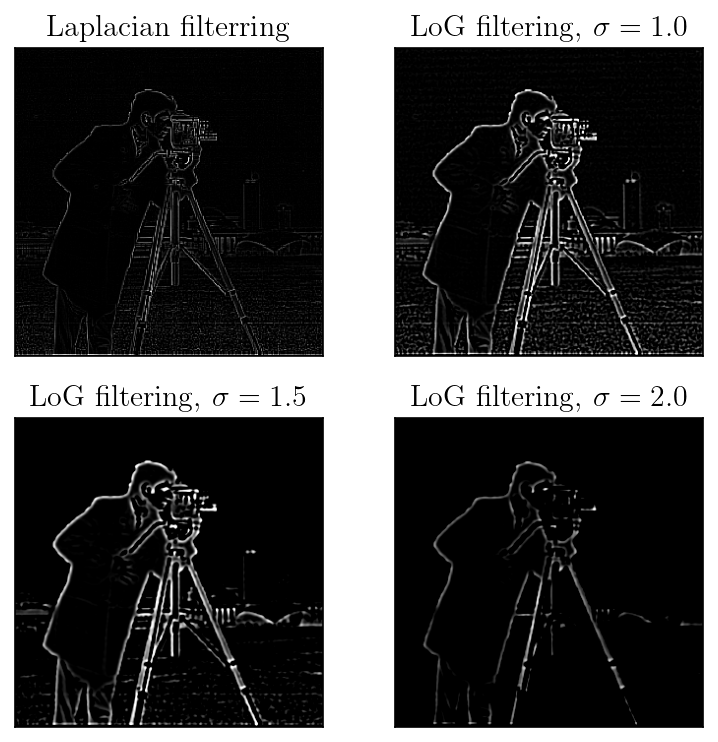

In [24]:
img0=cv2.cvtColor(cv2.imread("./img_filter_01.jpg"), cv2.COLOR_BGR2GRAY)[::3,::3]
fig = plt.figure(figsize=(6,6), dpi= 150, facecolor='w', edgecolor='w')
ax1, ax2, ax3, ax4= fig.add_subplot(221), fig.add_subplot(222), fig.add_subplot(223), \
    fig.add_subplot(224), 

img_lap = cv2.filter2D(img0, -1, laplacianfilter(0.4))
ax1.imshow(img_lap, cmap="gray")#, vmin=0, vmax=255)
ax1.set_title("Laplacian filterring")

img_log1 = cv2.filter2D(img0, -1, LoGfilter(9, 1.))
ax2.imshow(img_log1, cmap="gray")#, vmin=0, vmax=255)
ax2.set_title("LoG filtering, $\\sigma=1.0$ ")

img_log2 = cv2.filter2D(img0, -1, LoGfilter(9, 1.5))
ax3.imshow(img_log2, cmap='gray')#, vmin=0, vmax=255)
ax3.set_title("LoG filtering, $\\sigma=1.5$")


img_log3 = cv2.filter2D(img0, -1, LoGfilter(9, 2.0))
ax4.imshow(img_log3, cmap="gray")#, vmin=0, vmax=255)
ax4.set_title("LoG filtering, $\\sigma=2.0$")

for ax in fig.get_axes():
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)
    
plt.show()

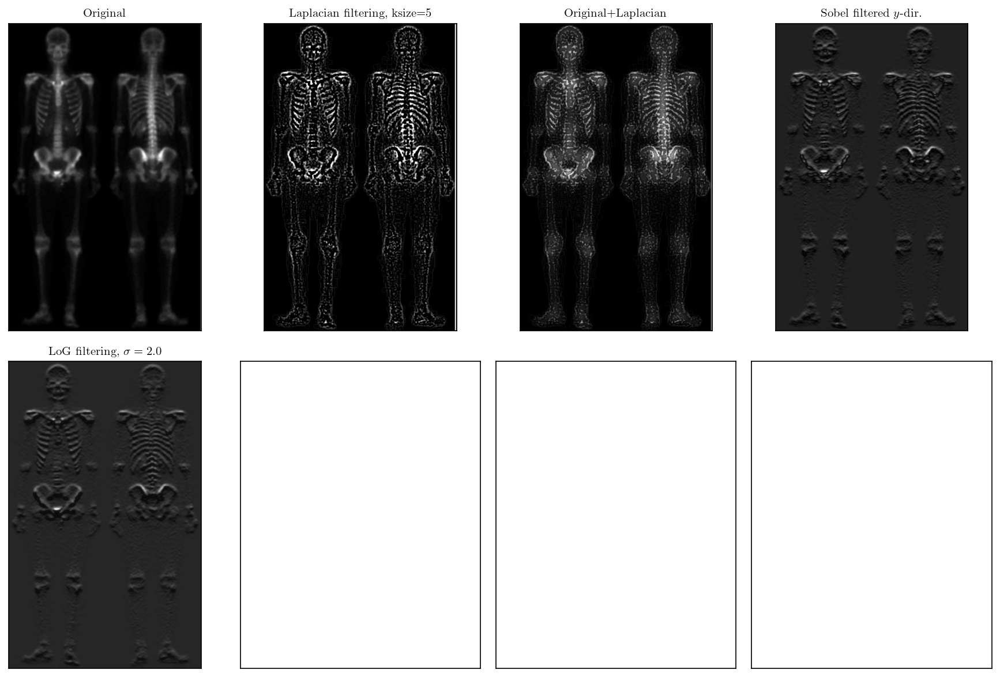

In [51]:
img0=cv2.cvtColor(cv2.imread("./img_filter_02.jpg"), cv2.COLOR_BGR2GRAY)
imgM, imgm = img0.max(), img0.min()
img0 = ((img0.astype(np.float64)-imgm)*imgM/(imgM-imgm))
fig = plt.figure(figsize=(12,8), dpi= 150, facecolor='w', edgecolor='w')
ax1, ax2, ax3, ax4 , ax5, ax6, ax7, ax8 = fig.add_subplot(241), fig.add_subplot(242), \
    fig.add_subplot(243), fig.add_subplot(244), fig.add_subplot(245), fig.add_subplot(246),\
    fig.add_subplot(247), fig.add_subplot(248)


ax1.imshow(img0, cmap="gray")#, vmin=0, vmax=255)
ax1.set_title("Original", fontdict={"fontsize":10})

#img_lap = cv2.filter2D(img0, -1, laplacianfilter(0.4))
img_lap = cv2.Laplacian(img0.astype(np.uint8), cv2.CV_8U, ksize=5)
# img_lap0 = img_lap.astype(np.float64)
# img_lap1 = (img_lap0-img_lap0.min())/(img_lap0.max()-img_lap0.min())*255.
ax2.imshow(img_lap, cmap="gray")#, vmin=0, vmax=255)
ax2.set_title("Laplacian filtering, ksize=5", fontdict={"fontsize":10})


#img_log1 = cv2.filter2D(img0, -1, LoGfilter(9, 1.))
ax3.imshow((img0+img_lap)/2., cmap="gray")#, vmin=0, vmax=255)
ax3.set_title("Original+Laplacian", fontdict={"fontsize":10})

img_sobel = cv2.Sobel(img0, -1, 0, 1, ksize=3, delta=32)
ax4.imshow(np.abs(img_sobel).astype(np.uint16), cmap='gray', vmin=0, vmax=255)
ax4.set_title("Sobel filtered $y$-dir.", size=10)

img_sobel_ave = cv2.filter2D(img_sobel, -1, np.ones((5,5))/25., cv2.BORDER_CONSTANT)
ax5.imshow(np.abs(img_sobel)+img_sobel_ave, cmap="gray")#, vmin=0, vmax=255)
ax5.set_title("LoG filtering, $\\sigma=2.0$", size=10)

for ax in fig.get_axes():
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)

fig.tight_layout()
plt.show()

# 3.5. 노이즈 처리를 위한 이미지 필터링

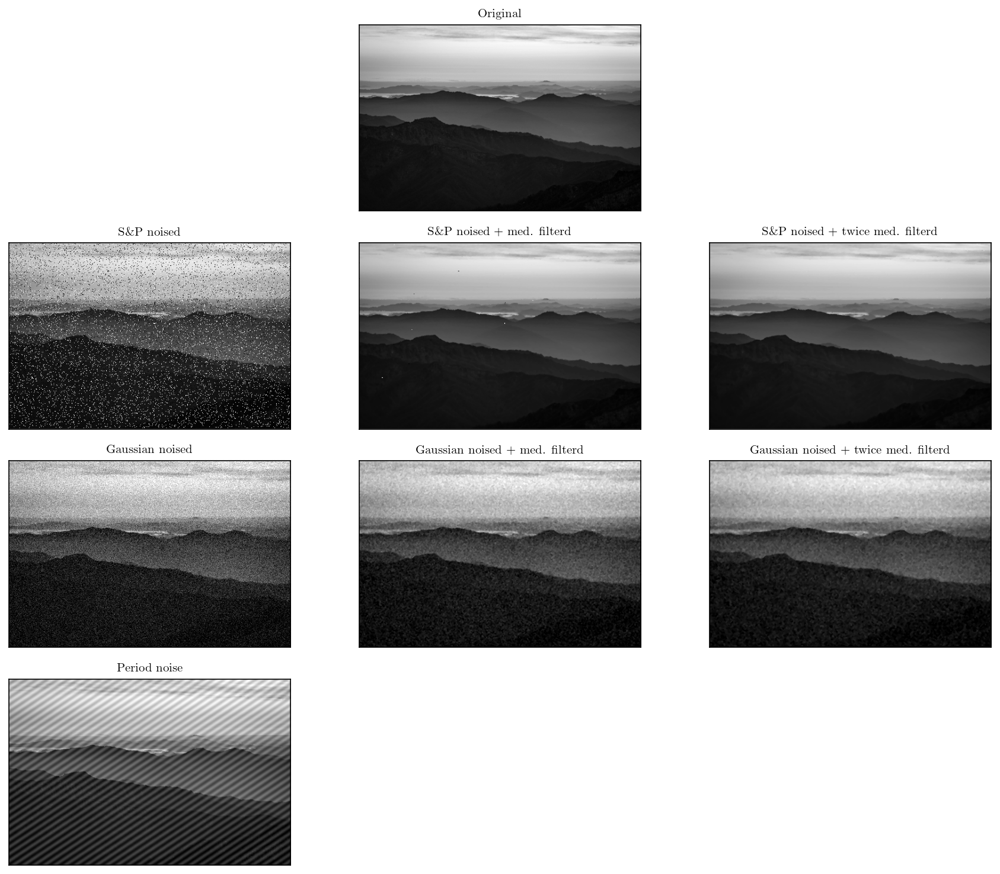

In [42]:
img0=cv2.cvtColor(cv2.imread("./img_denoise_01.png"), cv2.COLOR_BGR2GRAY)
fig = plt.figure(figsize=(12,10), dpi= 150, facecolor='w', edgecolor='w')
ax1, ax2, ax3, ax4 , ax5, ax6, ax7, ax8 = fig.add_subplot(4,3,2), fig.add_subplot(4,3,4), \
    fig.add_subplot(4,3,5), fig.add_subplot(4,3,6), fig.add_subplot(4,3,7), \
    fig.add_subplot(4,3,8), fig.add_subplot(4,3,9), fig.add_subplot(4,3,10)

ax1.imshow(img0, cmap="gray")#, vmin=0, vmax=255)
ax1.set_title("Original", fontdict={"fontsize":10})

# S&P noise processing
img_sp = make_sp_noise_256(img0, 0.05, 0.05)
ax2.imshow(img_sp, cmap='gray')
ax2.set_title("S\&P noised", fontdict={"fontsize":10})

img_sp_med_1=myfilter_gray_256(img_sp, "median", 3)
ax3.imshow(img_sp_med_1, cmap='gray', vmin=0, vmax=255)
ax3.set_title("S\&P noised + med. filterd", fontdict={"fontsize":10})

img_sp_med_2=myfilter_gray_256(img_sp_med_1, "median", 3)
ax4.imshow(img_sp_med_2, cmap='gray', vmin=0, vmax=255)
ax4.set_title("S\&P noised + twice med. filterd", fontdict={"fontsize":10})


# Gaussian noise processing
img_gau = make_gaussian_noise_256(img0, 25)
ax5.imshow(img_gau, cmap='gray')
ax5.set_title("Gaussian noised", fontdict={"fontsize":10})

img_gau_med_1=myfilter_gray_256(img_gau, "median", 3)
ax6.imshow(img_gau_med_1, cmap='gray', vmin=0, vmax=255)
ax6.set_title("Gaussian noised + med. filterd", fontdict={"fontsize":10})

img_gau_med_2=myfilter_gray_256(img_gau_med_1, "median", 3)
ax7.imshow(img_gau_med_2, cmap='gray', vmin=0, vmax=255)
ax7.set_title("Gaussian noised + twice med. filterd", fontdict={"fontsize":10})  

# periodic noise
X, Y = np.meshgrid(np.arange(img0.shape[1]), np.arange(img0.shape[0]))
img_pn=img0.astype(np.int64)+30*np.sin(X/3+Y/2)
ax8.imshow(img_pn, cmap='gray')
ax8.set_title("Period noise", size=10)



for ax in fig.get_axes():
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)

fig.tight_layout()
plt.show()

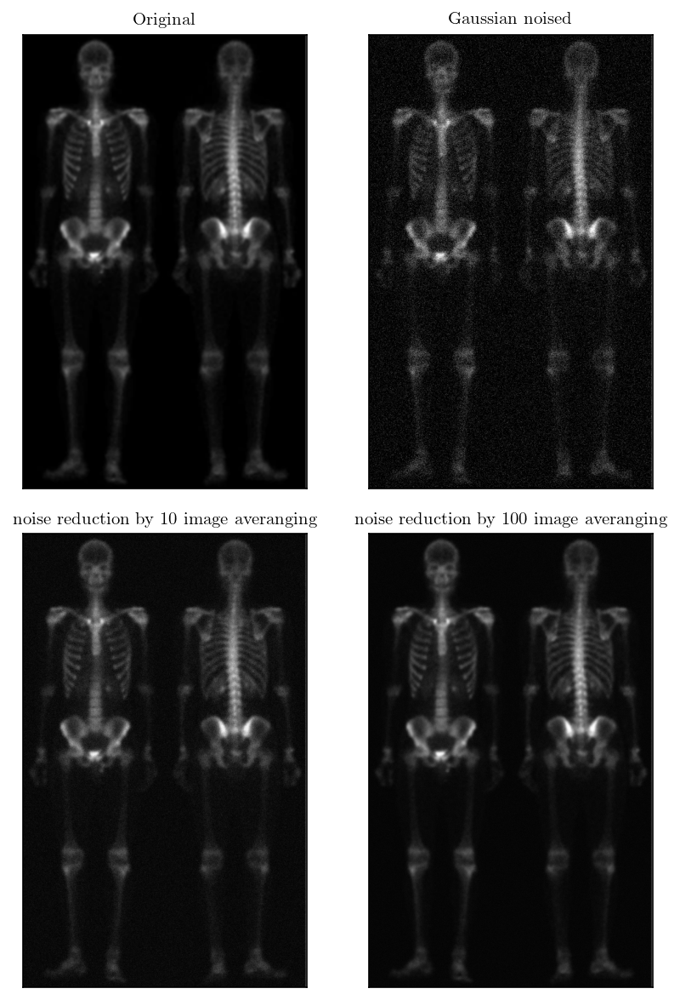

In [52]:
fig = plt.figure(figsize=(6,8), dpi= 150, facecolor='w', edgecolor='w')
ax1, ax2, ax3, ax4 = fig.add_subplot(2,2,1), fig.add_subplot(2,2,2), \
    fig.add_subplot(2,2,3), fig.add_subplot(2,2,4)

ax1.imshow(img0, cmap="gray")#, vmin=0, vmax=255)
ax1.set_title("Original", fontdict={"fontsize":10})


# Gaussian noise processing
img_gau = make_gaussian_noise_256(img0, 25)
ax2.imshow(img_gau, cmap='gray')
ax2.set_title("Gaussian noised", fontdict={"fontsize":10})

img_gau_10 = np.zeros(img_gau.shape, dtype=np.int64)
img_gau_100 = np.zeros(img_gau.shape, dtype=np.int64)

for i in range(10):
    img_gau_10 += make_gaussian_noise_256(img0, 25)
for i in range(100):
    img_gau_100 += make_gaussian_noise_256(img0, 25)

ax3.imshow(img_gau_10/10., cmap='gray')
ax3.set_title("noise reduction by 10 image averanging", fontdict={"fontsize":10})

ax4.imshow(img_gau_100/100., cmap='gray')
ax4.set_title("noise reduction by 100 image averanging", fontdict={"fontsize":10})


for ax in fig.get_axes():
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)

fig.tight_layout()
plt.show()

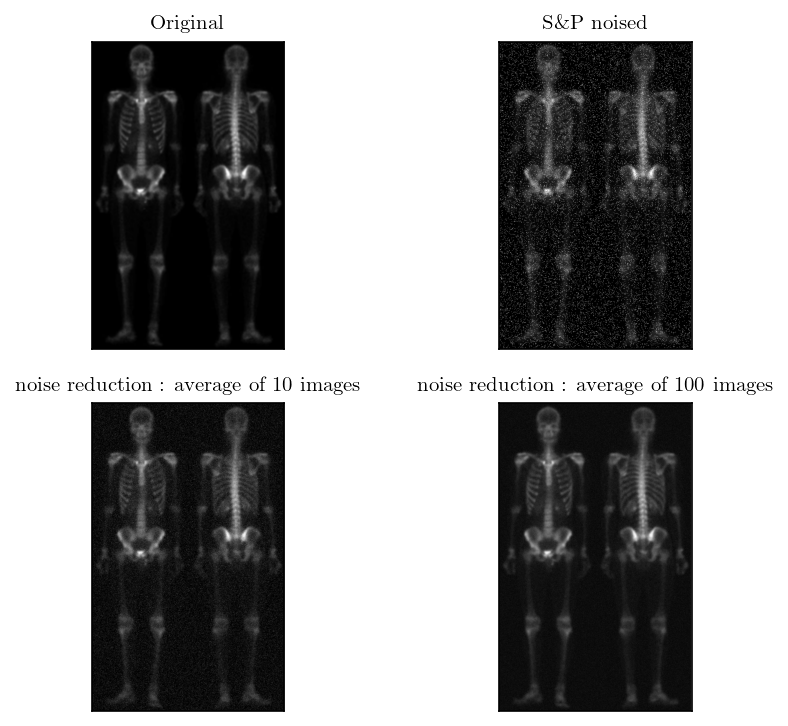

In [54]:
fig = plt.figure(figsize=(7,5), dpi= 150, facecolor='w', edgecolor='w')
ax1, ax2, ax3, ax4 = fig.add_subplot(2,2,1), fig.add_subplot(2,2,2), \
    fig.add_subplot(2,2,3), fig.add_subplot(2,2,4)

ax1.imshow(img0, cmap="gray")#, vmin=0, vmax=255)
ax1.set_title("Original", fontdict={"fontsize":10})


# Gaussian noise processing
img_sp = make_sp_noise_256(img0, 0.05, 0.05)
ax2.imshow(img_sp, cmap='gray')
ax2.set_title("S\&P noised", fontdict={"fontsize":10})

img_sp_10 = np.zeros(img_sp.shape, dtype=np.int64)
img_sp_100 = np.zeros(img_sp.shape, dtype=np.int64)

for i in range(10):
    img_sp_10 += make_sp_noise_256(img0, 0.05, 0.05).astype(np.int64)
for i in range(100):
    img_sp_100 += make_sp_noise_256(img0, 0.05, 0.05).astype(np.int64)

ax3.imshow(img_sp_10/10., cmap='gray')
ax3.set_title("noise reduction : average of 10 images", fontdict={"fontsize":10})

ax4.imshow(img_sp_100/100., cmap='gray')
ax4.set_title("noise reduction : average of 100 images", fontdict={"fontsize":10})


for ax in fig.get_axes():
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)

fig.tight_layout()
plt.show()

### 위너 필터 (Wiener filter)

원본 이미지 I 와 노이즈 처리된 이미지 J 사이의 차이를 통계적 관점에서 (혹은 확률적 관점에서) 정량화 하는 방법으로는 평균제곱편차 mean square error (MSE) 가 있다. MSE의 정의는 아래와 같다.

$$
\text{MSE} = \dfrac{1}{N} \sum_{i,\,j} \left[ I[i,\,j]-J[i,\,j]\right]^2
$$

위너 필터는 이러한 이미지 간 차이를 최소화하는 모든 종류의 비선형 필터를 의미한다. 

<br>

#### 위너 필터의 노이즈 감소 기능

- 원본 이미지 I에 노이즈 N 이 낀 이미지 I' 를 생각하자. 즉 다음과 같은 식을 생각하자.

$$
I'[i,j]=I[i,j]+N[i,j]
$$

- 노이즈의 경우 특별한 언급이 없으면 가우시안 노이즈를 생각한다. 그렇다면 노이즈의 평균은 $0$ 이 될 것이며 노이즈의 분산 $\sigma_N^2$ 는 $0$ 이 아닌 값을 갖는다. 어떤 픽셀을 중심으로 커널 배열을 덮어서 움직인다고 하자. 커널은 보통 원본 배열보다 아주 작기때문에 커널에 덮이는 영역의 평균은 $0$ 될 확률이 매우 낮으므로 그 평균값을 $m_{ij}$, 분산을 $\sigma^2_{ij}$ 라 하자. 이 때 해당 영역의 노이즈를 최소화하는 방식으로 노이즈를 처리하면 다음과 같은 관계식을 얻는다.

$$
J[i,j]=m_{ij} + \dfrac{\sigma^2_{ij}}{\sigma^2_{ij} + \sigma^2_N} {\big(} I[i,j]-m_{ij}{\big)}
$$

- 그런데 많은 경우 우리는 원본 이미지가 없이 노이즈가 낀 이미지만 있으므로 노이즈의 분산 $\sigma_N^2$ 를 모른다. 여기에 괜찮은 방법이 있는데, 그것은 바로 $\sigma_N^2$ 를 모든 로컬 분산 $\sigma_{ij}^2$ 의 평균으로 잡는 것이다. 

$$
\sigma_N^2 = \dfrac{1}{N} \sum_{i,j} \sigma^2_{i,j}
$$


#### 파이썬에서의 위너 필터

파이썬에서는 scipy 에서 wiener filter를 사용한다. Library refence 를 보면 대놓고 matlab의 wiener2 함수를 implementation 했다고 나온다. 사용법은 다음과 같다.

~~~python
from scipy.signal.signaltools import wiener

filtered_img = wiener(original_img, mysize=3)
~~~

여기서 mysize 는 kernel size 이다. 자세한 것은 library reference 참고. 이 때 주의할 것은 original_img 가 0 에서 255 사이의 정수값을 갖는, 보통 gray scale image 에서 많이 사용되는 uint8 형식의 정수형이면 안된다. 이 경우 다음과 같이 사용하는 것이 좋다.

~~~python
filtered_img = wiener(original_img.astype(np.float64), ksize)
~~~



In [264]:
from scipy.signal.signaltools import wiener

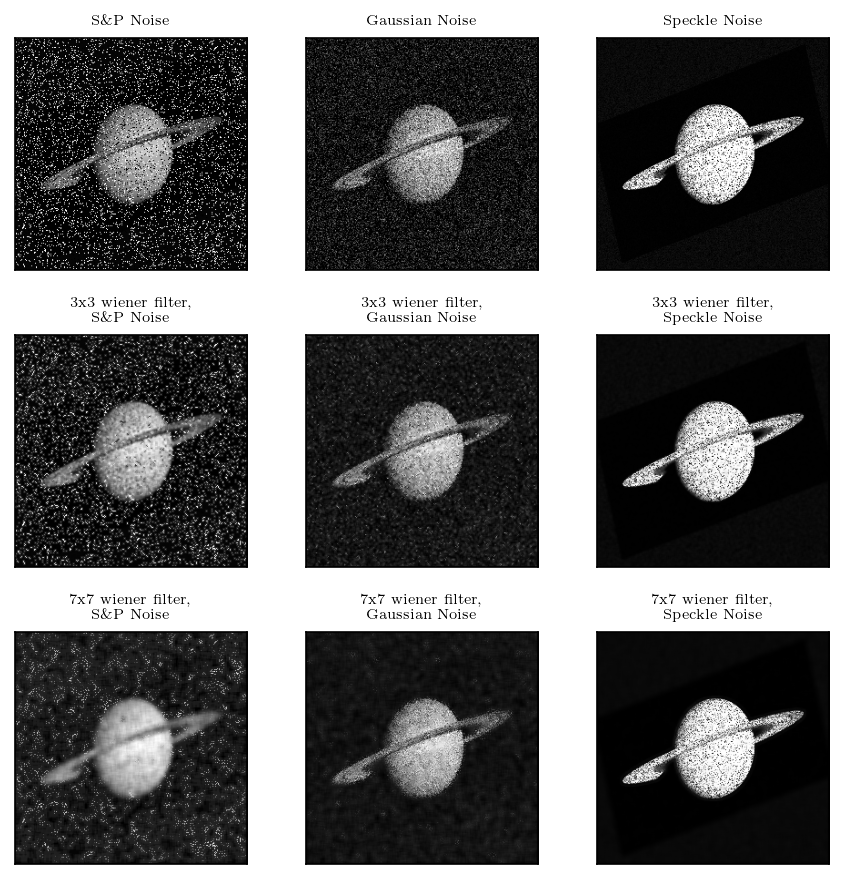

In [267]:
img01=cv2.cvtColor(cv2.imread("./img_saturn.jpg"), cv2.COLOR_BGR2GRAY)
img0 = cv2.resize(img01, dsize=(256, 256), interpolation=cv2.INTER_AREA)
img0[img0<1]=1
fig = plt.figure(figsize=(6,8), dpi= 150, facecolor='w', edgecolor='w')
ax1, ax2, ax3 = fig.add_subplot(4,3,1), fig.add_subplot(4,3,2), fig.add_subplot(4,3,3),
ax4, ax5, ax6 = fig.add_subplot(4,3,4), fig.add_subplot(4,3,5), fig.add_subplot(4,3,6),
ax7, ax8, ax9 = fig.add_subplot(4,3,7), fig.add_subplot(4,3,8), fig.add_subplot(4,3,9),



img1 = make_sp_noise_256(img0, 0.1, 0.1)
ax1.imshow(img1, cmap='gray')
ax1.set_title("S\&P Noise", size=7)

img2 = make_gaussian_noise_256(img0, 50)
ax2.imshow(img2, cmap='gray')
ax2.set_title("Gaussian Noise", size=7)

img3 = make_speckle_noise_256(img0, 1.0)
ax3.imshow(img3, cmap='gray')
ax3.set_title("Speckle Noise", size=7)

img4 = wiener(img1.astype(np.float64), 3) 
ax4.imshow(img4, cmap='gray')
ax4.set_title("3x3 wiener filter, \nS\&P Noise", size=7)

img5 = wiener(img2.astype(np.float64), 3) 
ax5.imshow(img5, cmap='gray')
ax5.set_title("3x3 wiener filter, \nGaussian Noise", size=7)

img6 = wiener(img3.astype(np.float64), 3) 
ax6.imshow(img6, cmap='gray')
ax6.set_title("3x3 wiener filter, \nSpeckle Noise", size=7)

img7 = wiener(img1.astype(np.float64), 7) 
ax7.imshow(img7, cmap='gray')
ax7.set_title("7x7 wiener filter, \nS\&P Noise", size=7)

img8 = wiener(img2.astype(np.float64), 7) 
ax8.imshow(img8, cmap='gray')
ax8.set_title("7x7 wiener filter, \nGaussian Noise", size=7)

img9 = wiener(img3.astype(np.float64), 7) 
ax9.imshow(img9, cmap='gray')
ax9.set_title("7x7 wiener filter, \nSpeckle Noise", size=7)

for ax in fig.get_axes():
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)

fig.tight_layout()
plt.show()